## This notebook demonstrates how the annotationn of LoTSS objects is handled for segmentation and bbox models using positions aquired from the CutoutCatalogue class (proxy for the AstroObject class) in the `strw_lofar_data_utils` library. The positions of the AstroObjects are aquired from a designated component catalogues for the DR2 mosaics we work with.

# Import necessary libraries and modules:

In [1]:
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.visualization import ImageNormalize, PercentileInterval, AsinhStretch

#########################
# strw_lofar_data_utils #
#########################
sys.path.append("/home/penchev/strw_lofar_data_utils")
from src.pipelines import generate_cutouts
from src.core.cutout_maker.cutout_catalogue import CutoutCatalogue

###################
# astro-datatools #
###################
sys.path.append('/home/penchev/astro-datatools/')
from astro_datatools.lotss_annotations import Segment, SegmentationMap, BBox


# Load a catalogue from which we will extract the RA and Dec for cutout generation:

In [2]:
GIANTS_CATALOG = "/home/penchev/strw_lofar_data_utils/data/discovered_giants_catalogue.csv"
GIANTS_CATALOG

'/home/penchev/strw_lofar_data_utils/data/discovered_giants_catalogue.csv'

In [3]:
giants_df = pd.read_csv(GIANTS_CATALOG)
giants_df.head()

,recno,Name,RAJ2000,DEJ2000,LengthMpc,e_LengthMpc,LengthAng,z,e_z,Ref,FistDisc
0,10511,NaN,40.275764,8.737979,0.871,0.008,32.70,0.02121,0.00017,Oei et al. 2023,Oei et al. 2023
1,10358,NaN,38.802856,10.196330,1.014,0.607,15.60,0.05384,0.00000,Oei et al. 2023,Oei et al. 2023
2,10283,NaN,48.697044,15.149883,1.067,0.505,12.70,0.07104,0.00000,Oei et al. 2023,Oei et al. 2023
3,10938,NaN,42.945000,15.836940,0.918,0.000,2.46,0.48900,0.00000,Mahato et al. 2021,Mahato et al. 2021
4,10055,NaN,43.804028,17.514114,1.295,0.441,11.60,0.09725,0.00000,Oei et al. 2023,Oei et al. 2023


# Extract RA and Dec from the catalogue to define cutout regions:

In [4]:
# Get RA and DEC for the first 100 giants
ra_dec_list = list(
    zip(giants_df["RAJ2000"].values, giants_df["DEJ2000"].values)
)

# Generate cutouts using the defined RA and Dec coordinates:

In [5]:
cutouts = generate_cutouts(
    ra_dec_list=ra_dec_list,
    size_pixels = 300,
    save=False,
)

Generating cutouts: 100%|██████████| 11585/11585 [00:53<00:00, 217.25it/s]


In [6]:
print(f"Generated {len(cutouts)} cutouts.")

Generated 8919 cutouts.


# Create a dictionary containing the different field names of each mosaics we used for the cutout creation

In [7]:
mosaic_dict = {}

for cutout in cutouts:
    mosaic_name = cutout.mosaic.field_name
    if mosaic_name not in mosaic_dict:
        mosaic_dict[mosaic_name] = 1
    else:
        mosaic_dict[mosaic_name] += 1

In [ ]:
check_cat_filename = "/net/vdesk/data2/penchev/project_data/data/combined_cat/combined-components-v0.8.fits" # Master Catalogue

# Read the catalogue as an Astropy Table
check_cat_table = Table.read(check_cat_filename)
print(f"Catalogue has {len(check_cat_table)} entries.")
# Convert to Pandas DataFrame for easier handling
df = check_cat_table.to_pandas()
print(df.columns)
df.head()

comp_cat = df

Catalogue has 4239116 entries.


,Component_Name,RA,DEC,E_RA,E_DEC,Total_flux,E_Total_flux,Peak_flux,E_Peak_flux,S_Code,...,DC_Maj,DC_Min,DC_PA,FLAG_WORKFLOW,FC_flag3,ID_flag,Created,Deblended_from,Parent_Source,Field
0,b'ILTJ000000.03+213232.5',0.000111,21.542373,1.020193,1.161326,0.874979,0.321576,0.364927,0.098894,b'S',...,8.257653,5.959811,148.354890,7,13,1,b'Ingest components',NaN,b'ILTJ000000.03+213232.5',b'Fall'
1,b'ILTJ000000.03+195152.1',0.000140,19.864494,1.321657,0.916540,1.232928,0.432089,0.465850,0.122948,b'S',...,9.339157,6.139031,101.294149,8,14,1,b'Ingest components',NaN,b'ILTJ000000.03+195152.1',b'Fall'
2,b'ILTJ000000.04+295526.3',0.000182,29.923997,0.616315,0.572983,0.884912,0.274432,0.647176,0.127702,b'S',...,4.411160,2.773950,125.045066,7,13,1,b'Ingest components',NaN,b'ILTJ000000.04+295526.3',b'Fall'
3,b'ILTJ000000.06+335035.7',0.000237,33.843268,0.375925,0.255449,0.689347,0.152789,0.727052,0.090796,b'S',...,0.000000,0.000000,0.000000,8,14,1,b'Ingest components',NaN,b'ILTJ000000.06+335035.7',b'Fall'
4,b'ILTJ000000.08+320812.2',0.000352,32.136742,0.544358,0.710789,1.421767,0.319074,0.633838,0.103298,b'S',...,7.699121,5.697443,178.122904,7,13,1,b'Ingest components',NaN,b'ILTJ000000.08+320812.2',b'Fall'


In [23]:
# Sort mosaics by number of cutouts
sorted_mosaics = sorted(mosaic_dict.items(), key=lambda x: x[1], reverse=True)
for mosaic_name, count in sorted_mosaics:
    print(f"Mosaic: {mosaic_name}, Cutouts: {count}")

Mosaic: P184+37, Cutouts: 34
Mosaic: P188+42, Cutouts: 34
Mosaic: P171+40, Cutouts: 31
Mosaic: P13Hetdex12, Cutouts: 31
Mosaic: P152+32, Cutouts: 30
Mosaic: P181+42, Cutouts: 30
Mosaic: P119+34, Cutouts: 29
Mosaic: P217+35, Cutouts: 29
Mosaic: P191+32, Cutouts: 29
Mosaic: P164+55, Cutouts: 28
Mosaic: P160+57, Cutouts: 28
Mosaic: P155+57, Cutouts: 28
Mosaic: P112+37, Cutouts: 28
Mosaic: P17, Cutouts: 27
Mosaic: P202+62, Cutouts: 27
Mosaic: P146+42, Cutouts: 26
Mosaic: P252+38, Cutouts: 26
Mosaic: P197+32, Cutouts: 26
Mosaic: P222+58, Cutouts: 26
Mosaic: P217+57, Cutouts: 26
Mosaic: P167+42, Cutouts: 25
Mosaic: P152+45, Cutouts: 25
Mosaic: P134+44, Cutouts: 25
Mosaic: P20Hetdex17, Cutouts: 25
Mosaic: P018+21, Cutouts: 24
Mosaic: P141+34, Cutouts: 24
Mosaic: P130+39, Cutouts: 24
Mosaic: P221+45, Cutouts: 24
Mosaic: P190+37, Cutouts: 24
Mosaic: P184+42, Cutouts: 24
Mosaic: P223+50, Cutouts: 24
Mosaic: P026+19, Cutouts: 23
Mosaic: P021+26, Cutouts: 23
Mosaic: P138+37, Cutouts: 23
Mosaic: P1

Chose a mosaic we wish to work on

In [30]:
mosaic_field_name = "P20Hetdex17"
cutouts_nr = mosaic_dict[mosaic_field_name]
print(f"Number of cutouts from mosaic {mosaic_field_name}: {cutouts_nr}")

Number of cutouts from mosaic P20Hetdex17: 25


# Load the component catalogue containing the positions of each object in the cutout

Extract only the relevant cutouts that are from the chosen mosaic

In [32]:
mosaic_cutouts = []

for cutout in cutouts:
    mosaic_name = cutout.mosaic.field_name
    if mosaic_name == mosaic_field_name:
        ra, dec = cutout.ra, cutout.dec
        mosaic_cutouts.append(cutout)

# Helper functions for visualization

In [33]:
RMS = 0.1

def visualize_annotations(data, segment_map, bbox, ao_dict):
    """
    Visualize the cutout data with segmentation map and bounding boxes.
    
    :param data: 2D numpy array of the cutout data
    :param segment_map: SegmentationMap object
    :param bbox: BBox object containing bounding box information
    :param ao_dict: Dictionary of AstroObject instances
    """
    # Get segmentation map and bounding boxes
    segmentation_map, segmentation_mapping = segment_map.get_full_segmentation(data)
    bboxes = bbox.get_bounding_boxes(data)
    
    # Create figure with two subplots
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    
    # Normalize the data for better visualization
    norm = ImageNormalize(data, interval=PercentileInterval(99.5), stretch=AsinhStretch())
    
    # Create contour levels
    contour_levels = np.array([5, 7, 9, 11]) * RMS * 1e-3
    
    # Plot 1: Original Data with contours and object positions
    ax[0].imshow(data, cmap='gray', origin="lower", norm=norm)
    ax[0].contour(data, levels=contour_levels, colors='black', linewidths=0.5, alpha=0.7)
    ax[0].set_title('Original Data with Catalog Objects')
    ax[0].set_xlabel('Pixel X')
    ax[0].set_ylabel('Pixel Y')
    
    # Plot the positions of the objects as circular markers with different colors for each object
    colors = plt.cm.tab10(range(len(ao_dict)))
    for idx, (obj_id, astro_obj) in enumerate(ao_dict.items()):
        ao_pixel_loc = astro_obj.get_pixel_positions()
        x_coords = [pos[0] for pos in ao_pixel_loc]  # Extract x coordinates for plotting
        y_coords = [pos[1] for pos in ao_pixel_loc]  # Extract y coordinates for plotting
        ax[0].scatter(
            x_coords,
            y_coords,
            edgecolor=colors[idx],
            facecolor='none',
            s=5,
            linewidths=2,
            label=f"{idx} - {obj_id}"
        )
        for x, y in zip(x_coords, y_coords):
            ax[0].text(
                x,
                y,
                str(idx),
                color=colors[idx],
                fontsize=24,
            )
    
    ax[0].legend()
    
    # Plot 2: Segmentation Map with Bounding Boxes
    cmap = plt.cm.tab20
    im2 = ax[1].imshow(segmentation_map, origin='lower', cmap=cmap)
    ax[1].set_title('Segmentation Map with Bounding Boxes')
    ax[1].set_xlabel('Pixel X')
    ax[1].set_ylabel('Pixel Y')
    
    # Add bounding boxes to the segmentation map (skip None values)
    for bbox_name, positions in bboxes.items():
        if positions is None:
            # Skip segments that don't have valid bounding boxes
            continue
            
        xmin = positions['left']
        xmax = positions['right']
        ymin = positions['bottom']
        ymax = positions['top']
        rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                             linewidth=2, edgecolor='red', facecolor='none')
        ax[1].add_patch(rect)
        
        # Add label
        if "GRG" in bbox_name.decode() if isinstance(bbox_name, bytes) else bbox_name:
            bbox_label = f"GRG"
            ax[1].text(xmin, ymin - 5, bbox_label, color='red', fontsize=8, weight='bold',
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))
    
    # Add legend for segmentation map
    if segmentation_mapping is not None:
        norm_seg = plt.Normalize(vmin=segmentation_map.min(), vmax=segmentation_map.max())
        legend_labels = [f"{seg_id.decode() if isinstance(seg_id, bytes) else seg_id}" 
                         for seg_id in segmentation_mapping.keys()]
        handles = [plt.Line2D([0], [0], marker='o', color='w', label=label,
                              markerfacecolor=cmap(norm_seg(segmentation_mapping[seg_id])), markersize=10)
                   for seg_id, label in zip(segmentation_mapping.keys(), legend_labels)]
        ax[1].legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    plt.close()

In [34]:
def convert_ao_dict_to_segment_dict(ao_dict):
    """
    Convert a dictionary of AstroObject instances to a dictionary of Segment instances.
    This is the plug that connects AstroObject with Segment, effectively translating
    the pixel positions of AstroObjects into Segments for segmentation mapping.
    
    :param ao_dict: Dictionary of AstroObject instances
    :return: Dictionary of Segment instances
    """
    segment_dict = {}
    for obj_id, astro_obj in ao_dict.items():
        x_y_pos = astro_obj.get_pixel_positions()
        segment_dict[obj_id] = Segment(x_y_pos, nr_sigmas=5)
    return segment_dict

def annotate_and_show(cutout_num: int):
    """
    Visualize the cutout with catalog objects annotated.
    
    :param cutout_num: Index of the cutout to visualize
    """
    # Get the current cutout and its data
    curr_cutout = mosaic_cutouts[cutout_num]
    data_cutout = curr_cutout.get_data()

    # Create CutoutCatalogue for the current cutout
    # This is needed to get the objects within the cutout
    # and is implemented in the strw_lofar_data_utils package.
    # It is the main way to link cutouts with catalog objects.
    cutout_cat = CutoutCatalogue(
        catalogue=comp_cat,
        cutout=curr_cutout,
        source_col="Parent_Source"
    )

    # Creates a dict of AstroObject instances for each unique object in the cutout
    ao_dict = cutout_cat.get_astro_objects_from_catalogue()
    segment_dict = convert_ao_dict_to_segment_dict(ao_dict)
    segment_map = SegmentationMap(segment_dict)
    bbox = BBox(segment_dict)

    visualize_annotations(data_cutout, segment_map, bbox, ao_dict)

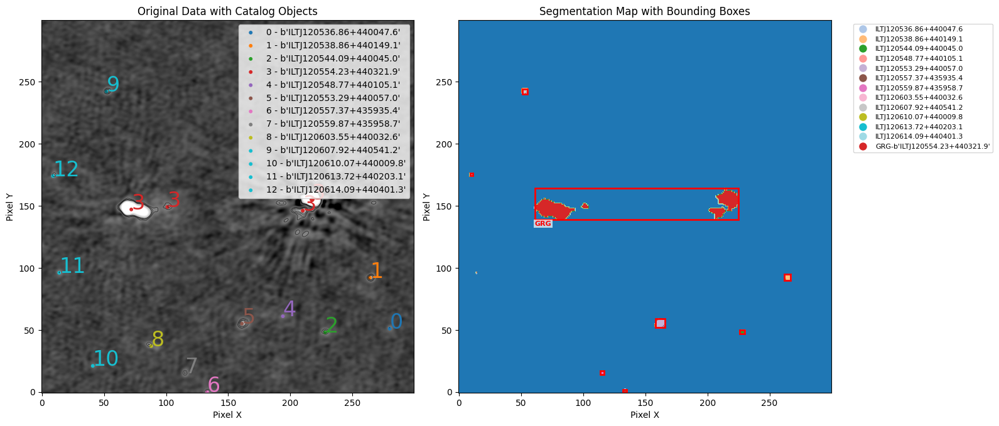

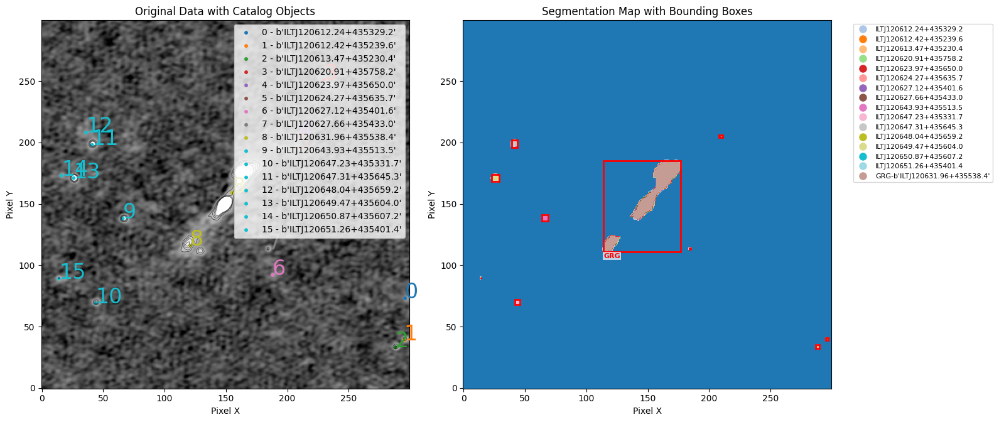

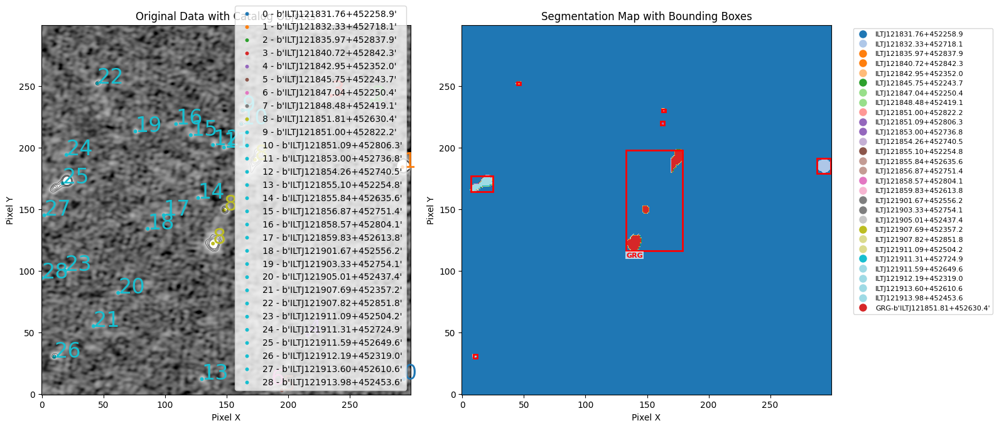

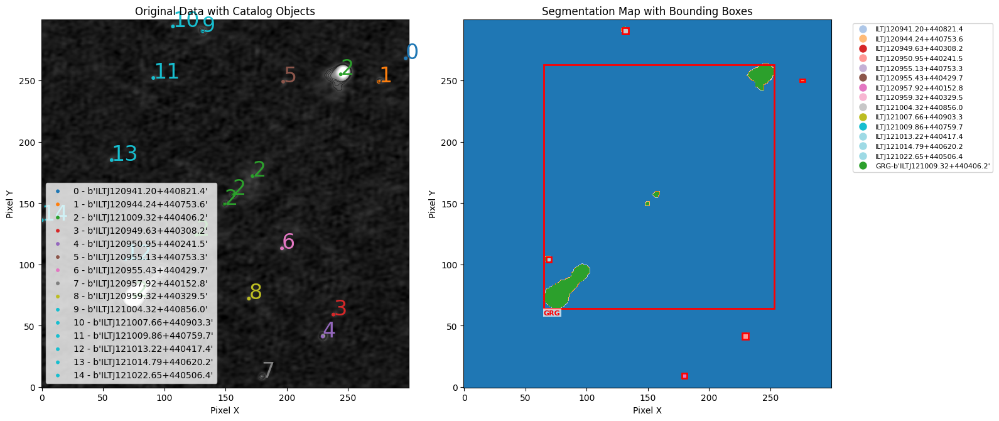

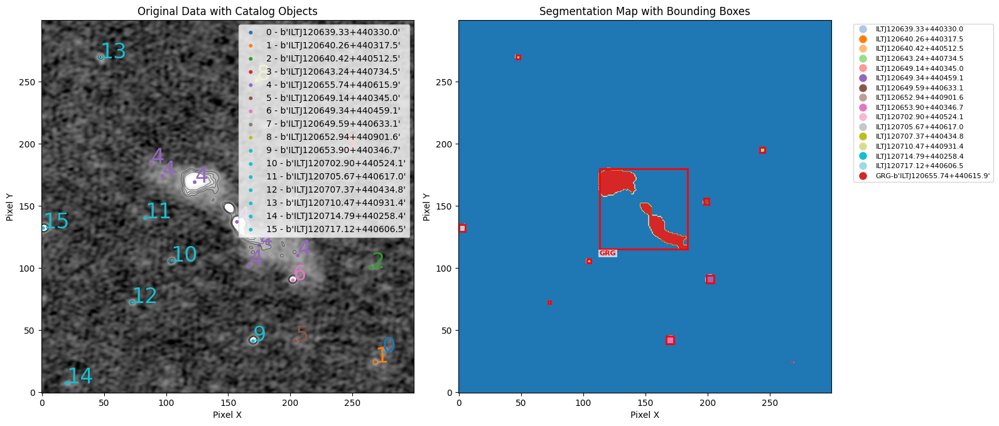

...

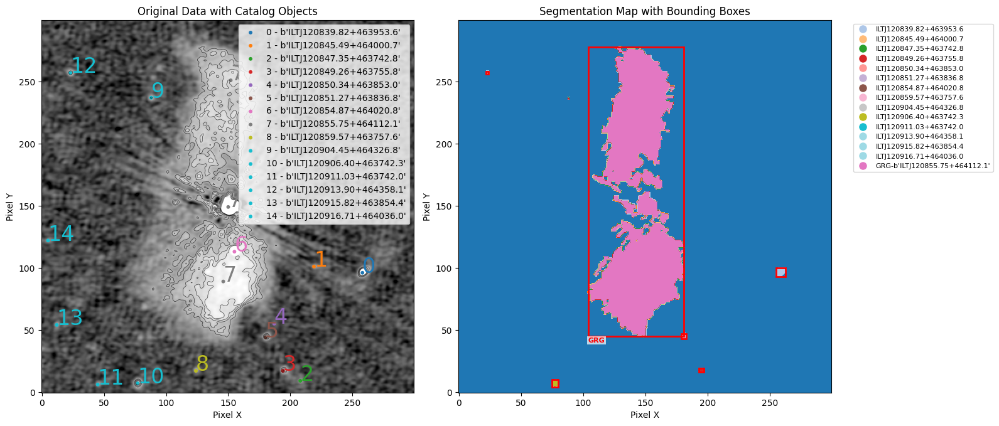

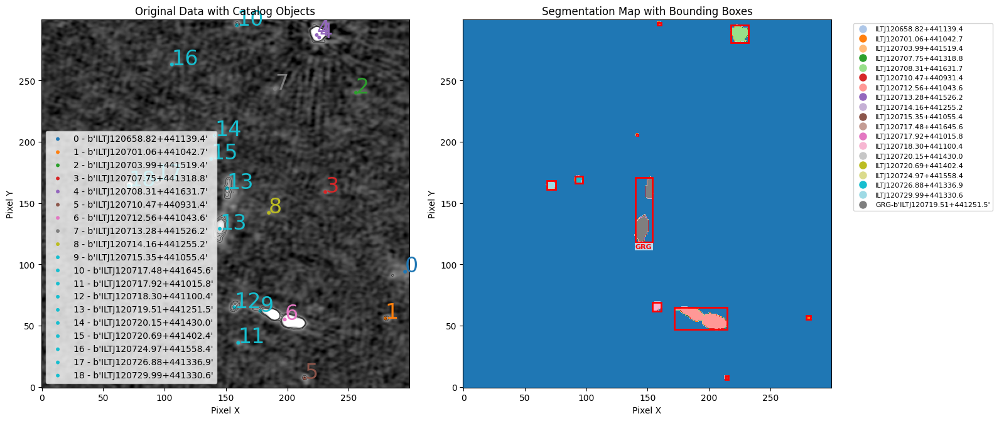

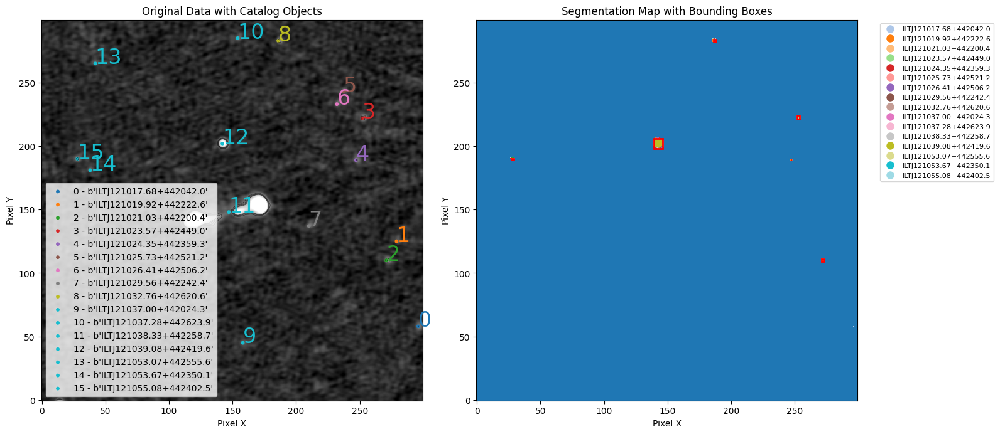

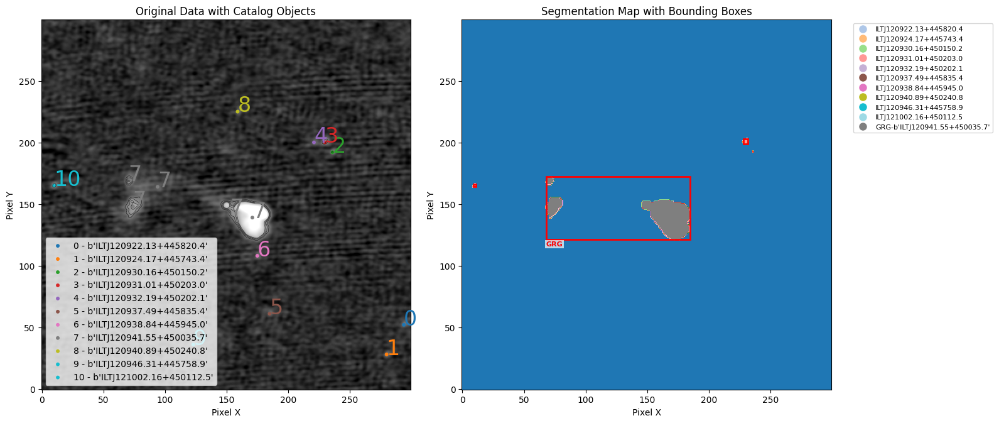

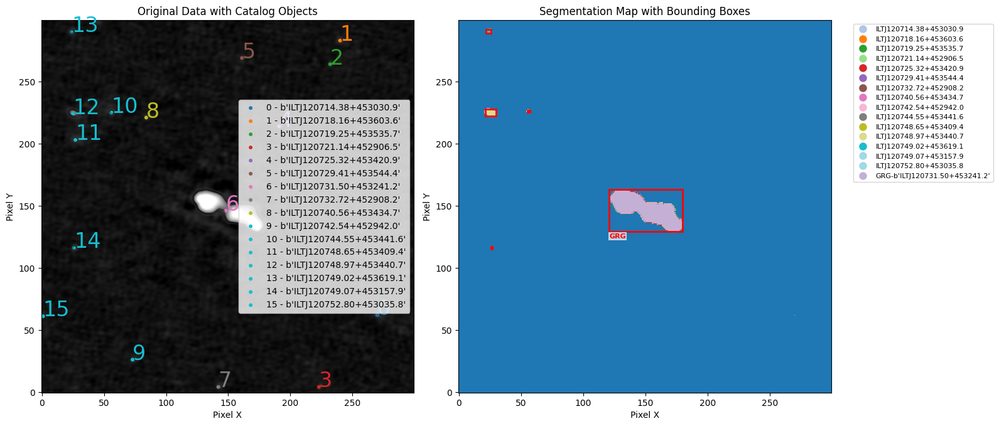

KeyboardInterrupt: 

In [35]:
for i in range(len(mosaic_cutouts)):
    annotate_and_show(i)